# Mapping in Python with geopandas

In [1]:
import matplotlib.pyplot as plt
import geopandas as gpd
import pysal as ps
from pysal.contrib.viz import mapping as maps
import palettable as pltt
import seaborn as sns
from seaborn import palplot
import numpy as np

from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')

%matplotlib inline

## Loading up spatial data 

The easiest way to get from a file to a quick visualization of the data is by loading it as a `GeoDataFrame` and calling the `plot` command. The main library employed for all of this is `geopandas` which is a geospatial extension of the `pandas` library, already introduced before. `geopandas` supports exactly the same functionality that `pandas` does (in fact since it is built on top of it, so most of the underlying machinery is pure `pandas`), plus a wide range of spatial counterparts that make manipulation and general "munging" of spatial data as easy as non-spatial tables.

In two lines of code, we will obtain a graphical representation of the spatial data contained in a file that can be in many formats; actually, since it uses the same drivers under the hood, you can load pretty much the same kind of vector files that QGIS permits. Let us start by plotting single layers in a crude but quick form, and we will build style and sophistication into our plots later on.

* Polygons

Let us begin with the most common type of spatial data in the social science: polygons. For example, we can load the geography of LSOAs in London with the following lines of code:

In [2]:
lsoas_london_link = 'data/shp/LSOA_2011_London_gen_MHW.shp'
lsoas_london = gpd.read_file(lsoas_london_link)

In [3]:
lsoas_london.head()

,LSOA11CD,LSOA11NM,MSOA11CD,MSOA11NM,LAD11CD,LAD11NM,RGN11CD,RGN11NM,USUALRES,HHOLDRES,COMESTRES,POPDEN,HHOLDS,AVHHOLDSZ,geometry
0,E01000001,City of London 001A,E02000001,City of London 001,E09000001,City of London,E12000007,London,1465,1465,0,112.9,876,1.7,"POLYGON ((532105.0919998939 182011.23, 532162...."
1,E01000002,City of London 001B,E02000001,City of London 001,E09000001,City of London,E12000007,London,1436,1436,0,62.9,830,1.7,"POLYGON ((532746.8130000263 181786.891000028, ..."
2,E01000003,City of London 001C,E02000001,City of London 001,E09000001,City of London,E12000007,London,1346,1250,96,227.7,817,1.5,"POLYGON ((532135.1449999654 182198.1190000199,..."
3,E01000005,City of London 001E,E02000001,City of London 001,E09000001,City of London,E12000007,London,985,985,0,52.0,467,2.1,"POLYGON ((533807.9460001207 180767.7700000888,..."
4,E01000006,Barking and Dagenham 016A,E02000017,Barking and Dagenham 016,E09000002,Barking and Dagenham,E12000007,London,1703,1699,4,116.2,543,3.1,"POLYGON ((545122.048999952 184314.931000118, 5..."


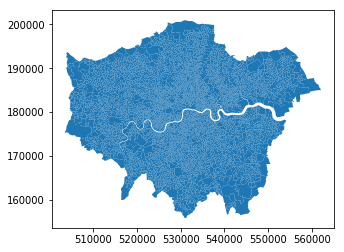

In [4]:
lsoas_london.plot()

This might not be the most aesthetically pleasant visual representation of the LSOAs geography, but it is hard to argue it is not quick to produce. We will work on styling and customizing spatial plots later on.

If you call a single row of the `geometry` column, it'll return a small plot ith the shape:

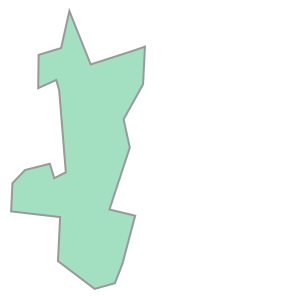

In [5]:
lsoas_london.loc[0, 'geometry']

* Lines

Displaying lines is as straight-forward as polygons. To load tube lines in London:

In [6]:
london_tube_link = 'data/shp/tublines_cropped.shp'

london_tube = gpd.read_file(london_tube_link)

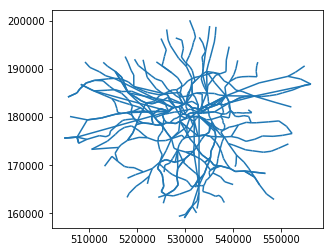

In [7]:
london_tube.plot()

* Points

Finally, points follow a similar structure. If we want to represent named places in London:

In [8]:
london_pois_link = 'data/shp/gis.osm_pois_free_1.shp'
london_pois = gpd.read_file(london_pois_link)

In [9]:
london_pois.head()

,osm_id,code,fclass,name,geometry
0,1,2724,memorial,Prime Meridian of the World,POINT (-0.0014863 51.4779481)
1,108042,2304,pub,The Jeremy Bentham,POINT (-0.1355294 51.5235359)
2,108539,2566,bicycle_rental,Windsor Terrace,POINT (-0.09338780000000001 51.5291251)
3,283885,2204,park,Ecology Park,POINT (0.0155375 51.4949874)
4,451152,2304,pub,The Dignity,POINT (-0.1946078 51.6008404)


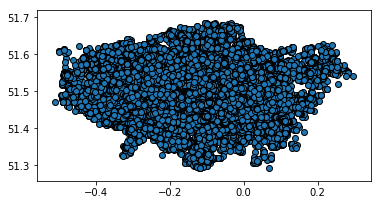

In [10]:
london_pois.plot(edgecolor='black')

In [11]:
london_pois = london_pois.to_crs({'datum': 'OSGB36',
    'k': 0.999601272,
    'lat_0': 49,
    'lon_0': -2,
    'no_defs': True,
    'proj': 'tmerc',
    'units': 'm',
    'x_0': 400000,
    'y_0': -100000
})

In [12]:
london_pois.head()

,osm_id,code,fclass,name,geometry
0,1,2724,memorial,Prime Meridian of the World,POINT (538883.6626286585 177336.8002570502)
1,108042,2304,pub,The Jeremy Bentham,POINT (529446.6498290602 182160.7723222271)
2,108539,2566,bicycle_rental,Windsor Terrace,POINT (532353.8406643413 182857.6413883177)
3,283885,2204,park,Ecology Park,POINT (540013.6053467105 179263.9919792821)
4,451152,2304,pub,The Dignity,POINT (525136.1065556833 190654.6705743241)


In [13]:
london_pois['fclass'].unique()

array(['memorial', 'pub', 'bicycle_rental', 'park', 'restaurant',
       'post_box', 'attraction', 'library', 'post_office',
       'public_building', 'telephone', 'fountain', 'artwork', 'museum',
       'toilet', 'cafe', 'pitch', 'recycling', 'bar', 'atm', 'cinema',
       'waste_basket', 'college', 'university', 'supermarket',
       'graveyard', 'hotel', 'laundry', 'courthouse', 'school',
       'pharmacy', 'sports_centre', 'monument', 'convenience', 'bank',
       'beverages', 'fast_food', 'fire_station', 'water_tower', 'doctors',
       'department_store', 'theatre', 'playground', 'bench',
       'bicycle_shop', 'newsagent', 'gift_shop', 'arts_centre',
       'recycling_paper', 'veterinary', 'dentist', 'recycling_glass',
       'chemist', 'hospital', 'town_hall', 'tourist_info', 'car_rental',
       'police', 'bakery', 'travel_agent', 'doityourself', 'windmill',
       'comms_tower', 'car_sharing', 'camera_surveillance', 'tower',
       'ruins', 'nursing_home', 'embassy', 'stadium

In [14]:
london_pubs = london_pois.loc[london_pois['fclass']=="pub"]
london_pubs.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 2029 entries, 1 to 49527
Data columns (total 5 columns):
osm_id      2029 non-null object
code        2029 non-null int64
fclass      2029 non-null object
name        1994 non-null object
geometry    2029 non-null object
dtypes: int64(1), object(4)
memory usage: 95.1+ KB


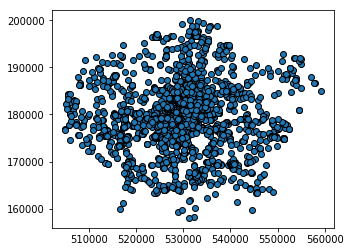

In [15]:
london_pubs.plot(edgecolor='black')

## Styling plots

It is possible to tweak several aspects of a plot to customize if to particular needs. In this section, we will explore some of the basic elements that will allow us to obtain more compelling maps.

* Remove axis
* Set title
* Customizing colors, lines, alpha
* Customizing size

These are styling options. Omit them or alter them to suit.

In [16]:
# from matplotlib import rc

# rc('font', **{'family':'DejaVu Sans',
#     'sans-serif':['Helvetica'],
#     'monospace': ['Inconsolata'],
#     'serif': ['Adobe Garamond Pro']}
#   )

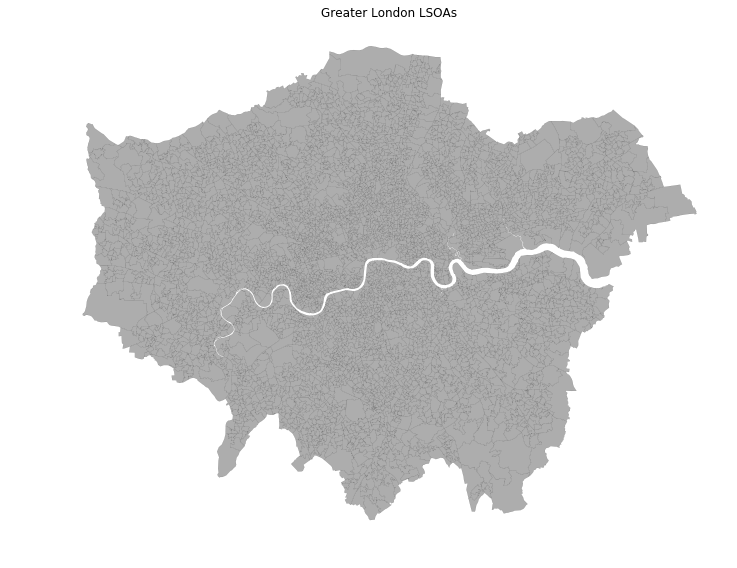

In [17]:
# Setup figure and axis
f, ax = plt.subplots(
    1, 
    figsize=(12., 8.),
    subplot_kw=dict(aspect='equal'))

# Remove axis frames
ax.axis('off')

# Plot layer of polygons on the axis
lsoas_london.plot(ax=ax, linewidth=0.1, facecolor='#999999', edgecolor='#111111', alpha=0.8)
# Display
plt.title('Greater London LSOAs')
plt.tight_layout()
plt.show()    

## Composing multi-layer maps

So far we have considered many aspects of plotting a single layer of data. However, in many cases, an effective map will require more than one: for example we might want to display streets on top of the polygons of neighborhoods, and add a few points for specific locations we want to highlight. At the very heart of GIS is the possibility to combine spatial information from different sources by overlaying it on top of each other, and this is fully supported in Python.

Essentially, combining different layers on a single map boils down to adding each of them to the same axis in a sequential way, as if we were literally overlaying one on top of the previous one. For example, let us get the simplest possible plot, one with the polygons from the LSOAs and the tube lines on top of them:

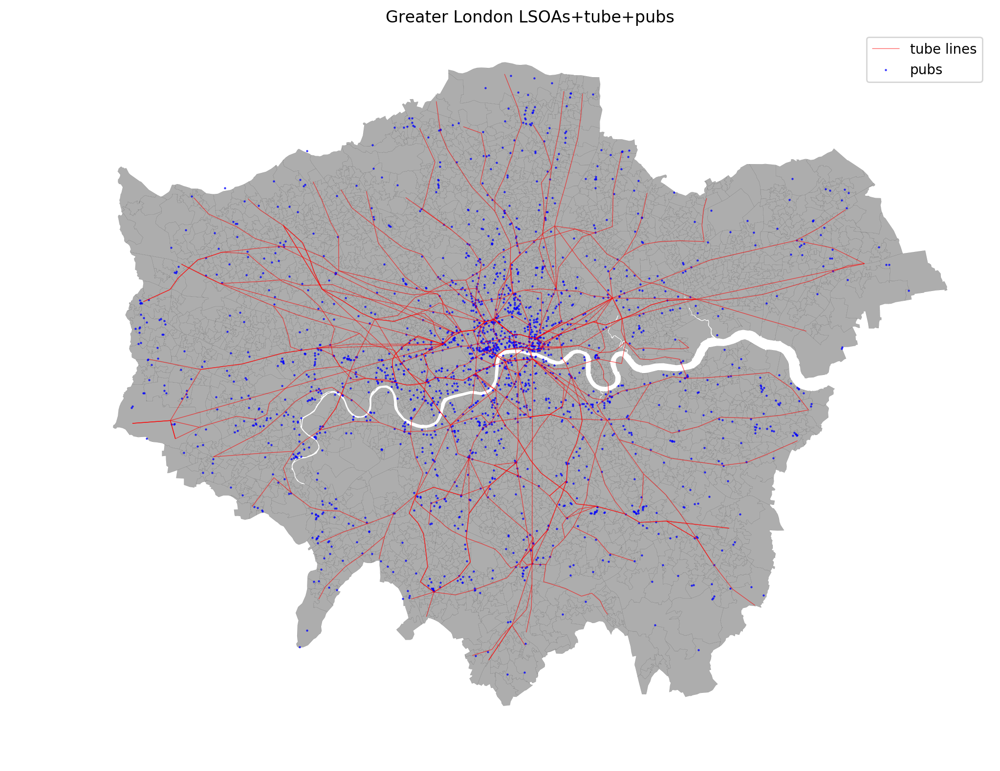

In [18]:

# Setup figure and axis
f, ax = plt.subplots(
    1, 
    figsize=(12., 8.),
    dpi=200,
    subplot_kw=dict(aspect='equal'))

# Remove axis frames
ax.axis('off')

# Plot layer of polygons on the axis
lsoas_london.plot(ax=ax, linewidth=0.05, facecolor='#999999', edgecolor='#111111', alpha=0.8)
london_tube.plot(ax=ax, linewidth=0.5, edgecolor='red', alpha=0.6, label='tube lines')
london_pubs.plot(ax=ax, linewidth=0.1, facecolor='blue', alpha=0.8, markersize=2, label='pubs')
# Display
ax.legend()
plt.title('Greater London LSOAs+tube+pubs')
plt.tight_layout()
plt.show()    

## Using palettes to create aesthetically pleasant maps

The choice of colors can influence the look and, ultimately, the effectiveness of a map. Although in some cases picking colors that simply allow you to distinguish the different elements might suffice, sometimes, you want to convey certain feelings (warmth, safety, etc.). In those cases, using preexisting palettes can be useful.

In this section, we will learn how to use pre-existent palettes to style your maps. We will be using the library [`palettable`](https://jiffyclub.github.io/palettable/), which provides many "canned" palettes. We will also use the handy function `palplot` (from the library `seaborn`) to examine the colors quickly.

For the sake of the example, let us use a palette based on one of Wes Anderson's movies, Darjeeling Limited:

<img src='http://66.media.tumblr.com/2815b755b493555dd4a74fc9f7c84bdb/tumblr_nj7cclt9qb1tvvqeko1_500.jpg'></img>

Here is how you can pull out those colors:

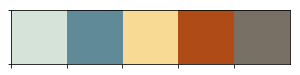

In [19]:
wes = pltt.wesanderson.Darjeeling2_5.hex_colors
palplot(wes)

Now, note how the object `wes` simply contains a list of colors in the hex standard:

In [20]:
wes

['#D5E3D8', '#618A98', '#F9DA95', '#AE4B16', '#787064']

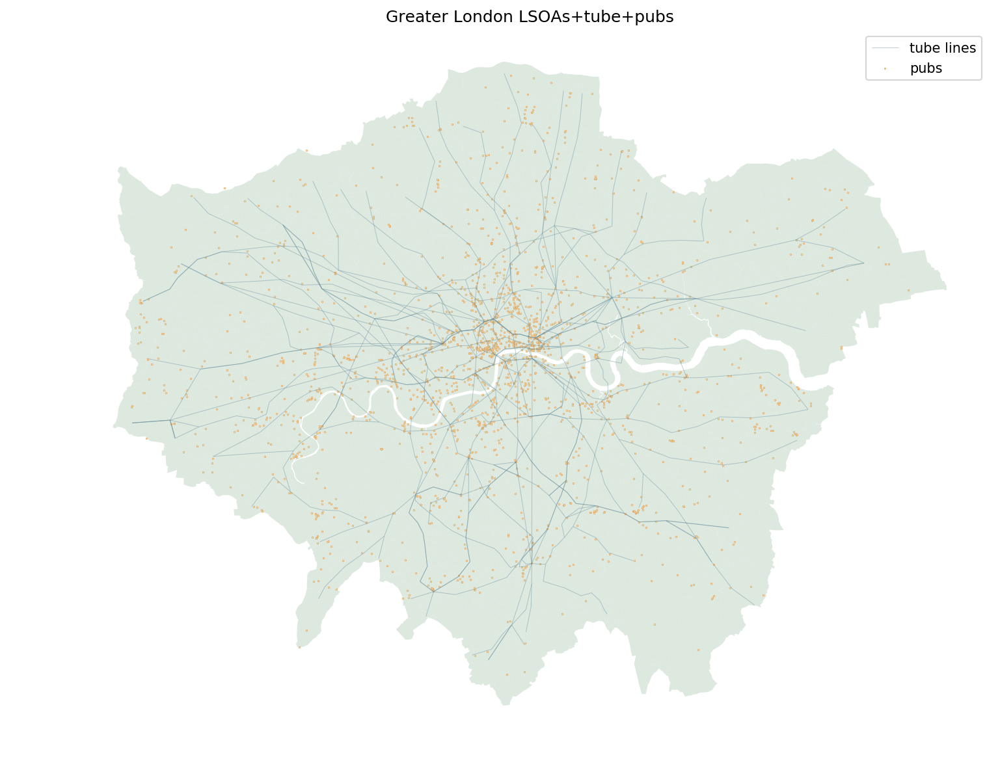

In [21]:
# Setup figure and axis
f, ax = plt.subplots(
    1, 
    figsize=(12., 8.),
    dpi=150,
    subplot_kw=dict(aspect='equal'))

# Remove axis frames
ax.axis('off')
ax.set_title('Greater London LSOAs+tube+pubs')

# Plot layer of polygons on the axis
lsoas_london.plot(ax=ax, linewidth=0.05, facecolor='#D5E3D8', 
                  edgecolor='#D5E3D8', alpha=0.8)
london_tube.plot(ax=ax, linewidth=0.5, edgecolor='#618A98', alpha=0.4, label='tube lines')
london_pubs.plot(ax=ax, linewidth=0.1, facecolor='#F9DA95', alpha=1.0, 
                 edgecolor='#AE4B16', markersize=2, label='pubs')
# Display
ax.legend()
plt.tight_layout()
plt.show()    

## Saving maps to figures 

Once we have produced a map we are content with, we might want to save it to a file so we can include it into a report, article, website, etc. Exporting maps in Python is as simple as replacing `plt.show` by `plt.savefig` at the end of the code block to specify where and how to save it. For example to save the previous map into a `png` file in the same folder where the notebook is hosted:

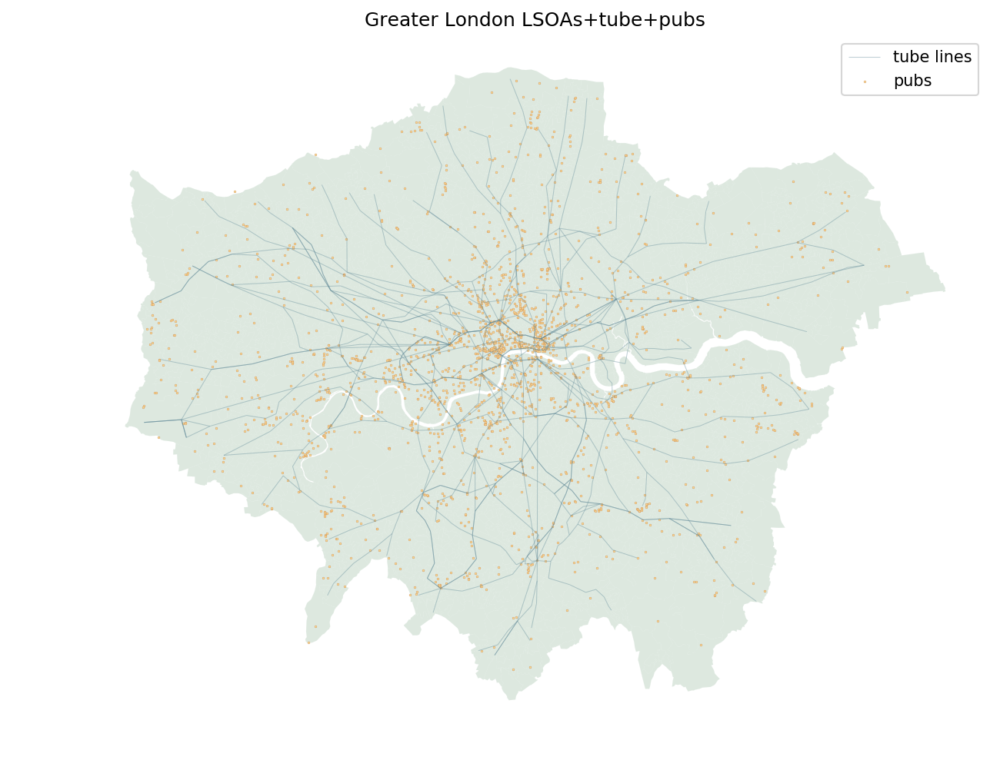

In [22]:
# Setup figure and axis
f, ax = plt.subplots(
    1, 
    figsize=(12., 8.),
    dpi=150,
    subplot_kw=dict(aspect='equal'))

# Remove axis frames
ax.axis('off')
ax.set_title('Greater London LSOAs+tube+pubs')

# Plot layer of polygons on the axis
lsoas_london.plot(ax=ax, linewidth=0.05, facecolor='#D5E3D8', 
                  edgecolor='#D5E3D8', alpha=0.8)
london_tube.plot(ax=ax, linewidth=0.5, edgecolor='#618A98', alpha=0.4, label='tube lines')
london_pubs.plot(ax=ax, linewidth=0.1, facecolor='#F9DA95', alpha=1.0, 
                 edgecolor='#AE4B16', markersize=2, label='pubs')
ax.legend()   
# Save to file
plt.savefig('figs/london_tube_pubs.png', dpi=500, transparent=True, tight_layout=True)

In [23]:
imd_london_link = 'data/shp/IMD2015.shp'
# Read the file in
imd_london = gpd.read_file(imd_london_link)
imd_london['geometry'] = imd_london.simplify(0.9)
# Index it on the LSOA ID
imd_london = imd_london.set_index('lsoa11cd')
# Display summary
imd_london.head()

,imd,income,employment,education,health,crime,housing,environmen,lsoa11nm,msoa11cd,...,christian_,buddhist_p,hindu_p,jewish_p,muslim_p,sikh_p,other_re_1,no_relig_1,religion_1,geometry
lsoa11cd,,,,,,,,,,,,,,,,,,,,,
E01000001,6.063,0.011,0.015,0.021,-1.918,-1.649,27.134,34.502,City of London 001A,E02000001,...,43.5,1.4,2.7,3.1,1.2,0.0,0.2,38.7,9.1,"POLYGON ((532105.0919998939 182011.23, 532162...."
E01000002,6.255,0.012,0.017,0.040,-1.931,-1.692,26.358,37.106,City of London 001B,E02000001,...,45.2,0.9,1.5,1.5,0.3,0.1,0.4,40.4,9.7,"POLYGON ((532746.8130000263 181786.891000028, ..."
E01000003,19.548,0.105,0.088,9.612,0.321,-0.987,31.861,48.337,City of London 001C,E02000001,...,44.2,1.5,2.2,2.4,4.1,0.5,0.4,34.6,10.1,"POLYGON ((532135.1449999654 182198.1190000199,..."
E01000005,26.005,0.217,0.144,15.045,0.050,-0.831,35.104,34.811,City of London 001E,E02000001,...,41.4,1.1,1.0,4.1,27.7,0.4,0.5,17.8,6.0,"POLYGON ((533807.9460001207 180767.7700000888,..."
E01032739,13.169,0.014,0.011,1.700,-1.046,-0.913,35.456,65.852,City of London 001F,E02000001,...,48.9,0.9,3.1,1.2,3.4,0.4,0.2,32.7,9.2,"(POLYGON ((531667.6240003224 180534.99200049, ..."


# Choropleths

## Unique values

A choropleth for categorical variables simply assigns a different color to every potential value in the series. The main requirement in this case is then for the color scheme to reflect the fact that different values are not ordered or follow a particular scale.

In Python, thanks to `geopandas`, creating categorical choropleths is possible with one line of code. To demonstrate this, we can plot the spatial distribution of LSOAs with a more white population than other races and viceversa:

In [24]:
imd_london['majority_race'] = np.where(imd_london.eval("white_p > 50"), "White", "Other")

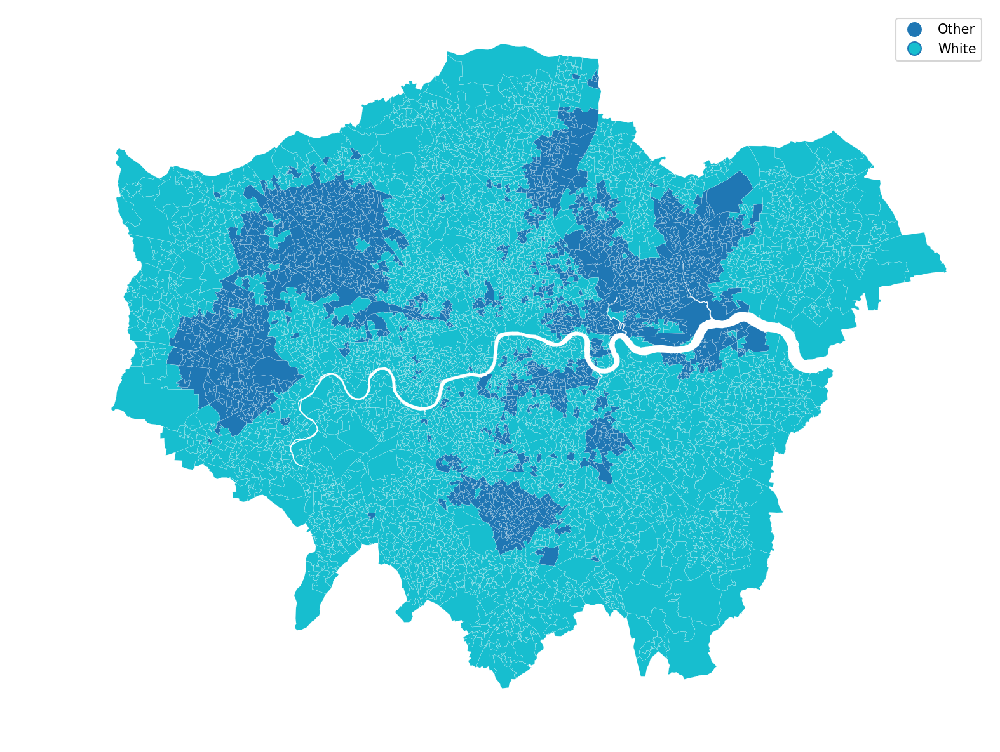

In [25]:
f, ax = plt.subplots(
    1, 
    figsize=(12., 8.),
    dpi=150,
    subplot_kw=dict(aspect='equal'))

ax.axis('off')

imd_london.plot(
    ax=ax,
    column='majority_race',
    categorical=True,
    alpha=1, 
    edgecolor='w', 
    linewidth=0.1, 
    legend=True, 
    antialiased=True
)

plt.tight_layout()
plt.show()

Let us stop for a second in a few crucial aspects:

* Note how we are using the same approach as for basic maps, the command `plot`, but we now need to add the argument `column` to specify which column in particular is to be represented.
* Since the variable is categorical we need to make that explicit by setting the argument `categorical` to `True`.
* As an optional argument, we can set `legend` to `True` and the resulting figure will include a legend with the names of all the values in the map.
* Unless we specify a different colormap, the selected one respects the categorical nature of the data by not implying a gradient or scale but a qualitative structure.

## Equal intervals

If, instead of categorical variables, we want to display the geographical distribution of a continuous phenomenon, we need to select a way to encode each value into a color. One potential solution is applying what is usually called "equal intervals". The intuition of this method is to split the *range* of the distribution, the difference between the minimum and maximum value, into equally large segments and to assign a different color to each of them according to a palette that reflects the fact that values are ordered.

Using the example of the position of a LSOA in the national ranking of the IMD (`imd_rank`), we can calculate these segments, also called bins or buckets, using the library `PySAL`:

In [26]:
imd_attribute = 'crime'

In [27]:
classes = ps.Equal_Interval(imd_london[imd_attribute], k=7)
classes

              Equal Interval              
 
Lower            Upper               Count
         x[i] <= -1.193                  7
-1.193 < x[i] <= -0.556                142
-0.556 < x[i] <=  0.081                839
 0.081 < x[i] <=  0.717               1935
 0.717 < x[i] <=  1.354               1584
 1.354 < x[i] <=  1.991                302
 1.991 < x[i] <=  2.628                 26

The only additional argument to pass to `Equal_Interval`, other than the actual variable we would like to classify is the number of segments we want to create, `k`, which we are arbitrarily setting to seven in this case. This will be the number of colors that will be plotted on the map so, although having several can give more detail, at some point the marginal value of an additional one is fairly limited, given the ability of the brain to tell any differences.

Once we have classified the variable, we can check the actual break points where values stop being in one class and become part of the next one:

In [28]:
classes.bins

array([-1.19314286, -0.55628571,  0.08057143,  0.71742857,  1.35428571,
        1.99114286,  2.628     ])

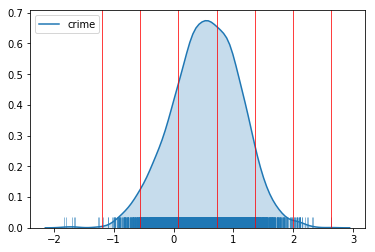

In [29]:
def draw_bins(geodf, attribute, scheme):

    schemes = {'equal_interval': ps.Equal_Interval, \
               'quantiles': ps.Quantiles, \
               'fisher_jenks': ps.Fisher_Jenks}
    
    classi = schemes[scheme](geodf[attribute], k=7)
    
    # Set up the figure
    f, ax = plt.subplots(1)
    # Plot the kernel density estimation (KDE)
    sns.kdeplot(geodf[attribute], shade=True)
    # Add a blue tick for every value at the bottom of the plot (rugs)
    sns.rugplot(geodf[attribute], alpha=0.5)
    # Loop over each break point and plot a vertical red line
    for cut in classi.bins:
        plt.axvline(cut, color='red', linewidth=0.75)
    # Display image
    plt.show()

draw_bins(imd_london, imd_attribute, 'equal_interval')

Technically speaking, the figure is created by overlaying a KDE plot with vertical bars for each of the break points. This makes much more explicit the issue highlighed by which the first bin contains a large amount of observations while the one with top values only encompasses a handful of them.

To create a map that displays the colors assigned by the equal interval classification algorithm, we use a similar approach as with unique values but with some key differences:

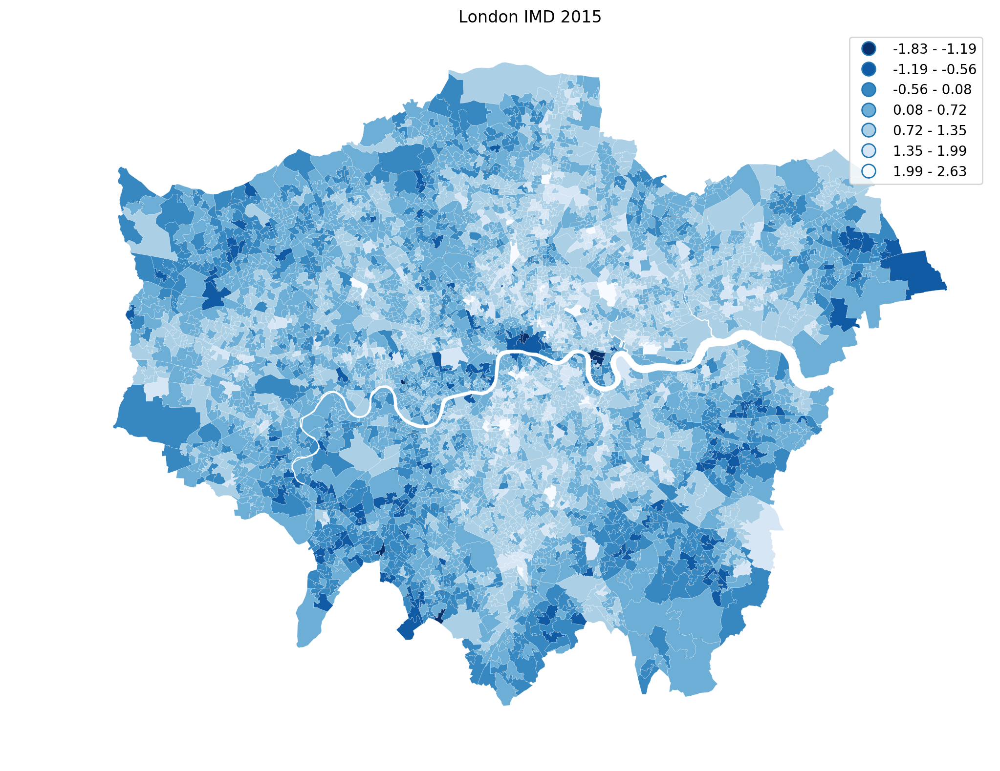

In [30]:
f, ax = plt.subplots(
    1, 
    figsize=(12., 8.),
    dpi=200,
    subplot_kw=dict(aspect='equal'))

ax.axis('off')
ax.set_title("London IMD 2015")

imd_london.plot(
    ax=ax,
    column=imd_attribute, 
    scheme='equal_interval', k=7, 
    cmap=plt.cm.Blues_r, 
    alpha=1, 
    edgecolor='w', 
    linewidth=0.1, 
    legend=True, 
    antialiased=True
)

plt.tight_layout()
plt.show()

We can use the parameter `legend_kwds` to customize the legend appearance (make sure you install geopandas directly from the github repository otherwise the `legend_kwds` parameter will not work properly as of now):

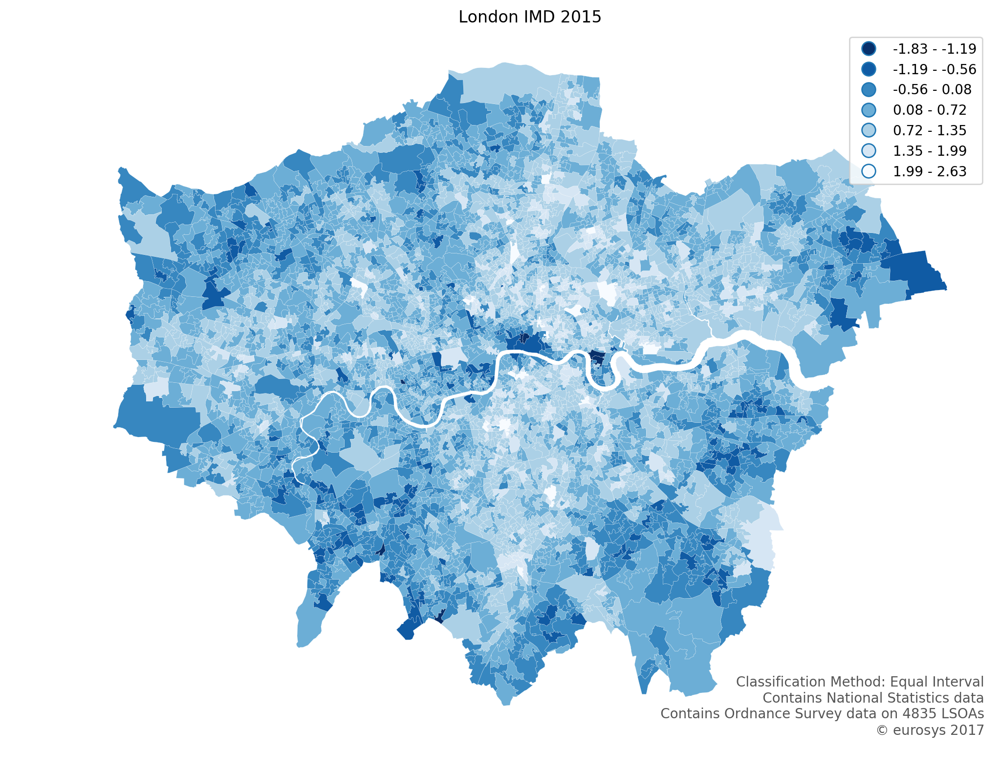

In [31]:
f, ax = plt.subplots(
    1, 
    figsize=(12., 8.),
    dpi=200,
    subplot_kw=dict(aspect='equal'))

ax.axis('off')
ax.set_title("London IMD 2015")

imd_london.plot(
    ax=ax,
    column=imd_attribute, 
    scheme='equal_interval', k=7, 
    cmap=plt.cm.Blues_r, 
    alpha=1, 
    edgecolor='w', 
    linewidth=0.1, 
    legend=True, 
    antialiased=True
)

# Display data sources
smallprint = ax.text(
    .995, 0,
    'Classification Method: Equal Interval\n \
    Contains National Statistics data\n \
    Contains Ordnance Survey data on %d LSOAs\n \
    $\copyright$ eurosys 2017' % int(imd_london[imd_attribute].count()),
    ha='right', va='bottom',
    size=10,
    color='#555555',
    transform=ax.transAxes)

plt.tight_layout()
plt.show()


In [35]:
from geopandas.plotting import plot_dataframe


legend_kwds_default = {
    'loc':'lower right', 
     'fontsize':10, 
    'shadow':True, 
    'fancybox':True, 
    'frameon':True,
    'framealpha':1.0,
    'edgecolor':'#999999',
    'facecolor':'#FFFFFF',
    'bbox_to_anchor':(1, 0.1)
}

def draw_choropleth(geodf, attribute, scheme, cmap=plt.cm.Blues_r, dpi=200, width=12., 
                    height=8., title=None,legend_kwds=legend_kwds_default, smallprint=None):
    f, ax = plt.subplots(
    1, 
    figsize=(width, height),
    dpi=dpi,
    subplot_kw=dict(aspect='equal'))

    ax.axis('off')
    
    if title:
        ax.set_title(title)

    plot_dataframe(
        geodf,
        ax=ax,
        column=attribute, 
        scheme=scheme, 
        k=7, 
        cmap=cmap, 
        alpha=1, 
        edgecolor='w', 
        linewidth=0.1, 
        legend=True, 
        antialiased=True,
        legend_kwds=legend_kwds
    )

    # Display data sources
    if smallprint:
        ax.text(smallprint,
            ha='right', va='bottom',
            size=10,
            color='#555555',
            transform=ax.transAxes)

    plt.tight_layout()
    plt.show()
    
    
    

## Quantiles 

One solution to obtain a more balanced classification scheme is using quantiles. This, by definition, assigns the same amount of values to each bin: the entire series is laid out in order and break points are assigned in a way that leaves exactly the same amount of observations between each of them. This "observation-based" approach contrasts with the "value-based" method of equal intervals and, although it can obscure the magnitude of extreme values, it can be more informative in cases with skewed distributions.

Calculating a quantiles classification with `PySAL` can be done with the following line of code:

In [36]:
classes = ps.Quantiles(imd_london[imd_attribute], k=7)
classes

                Quantiles                
 
Lower            Upper              Count
         x[i] <= -0.065               691
-0.065 < x[i] <=  0.237               691
 0.237 < x[i] <=  0.454               687
 0.454 < x[i] <=  0.666               696
 0.666 < x[i] <=  0.890               689
 0.890 < x[i] <=  1.144               690
 1.144 < x[i] <=  2.628               691

And, similarly, the bins can also be inspected:

In [37]:
classes.bins

array([-0.06485714,  0.23714286,  0.454     ,  0.666     ,  0.89      ,
        1.14442857,  2.628     ])

The visualization of the distribution can be generated in a similar way as well:

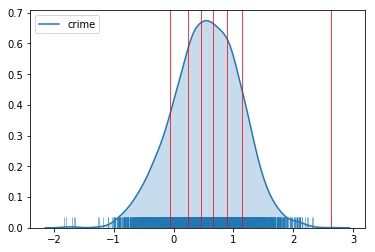

In [38]:
draw_bins(imd_london, imd_attribute, 'quantiles')

And the choropleth also follows a similar pattern, with the difference that we are now using the scheme "quantiles", instead of "equal interval":

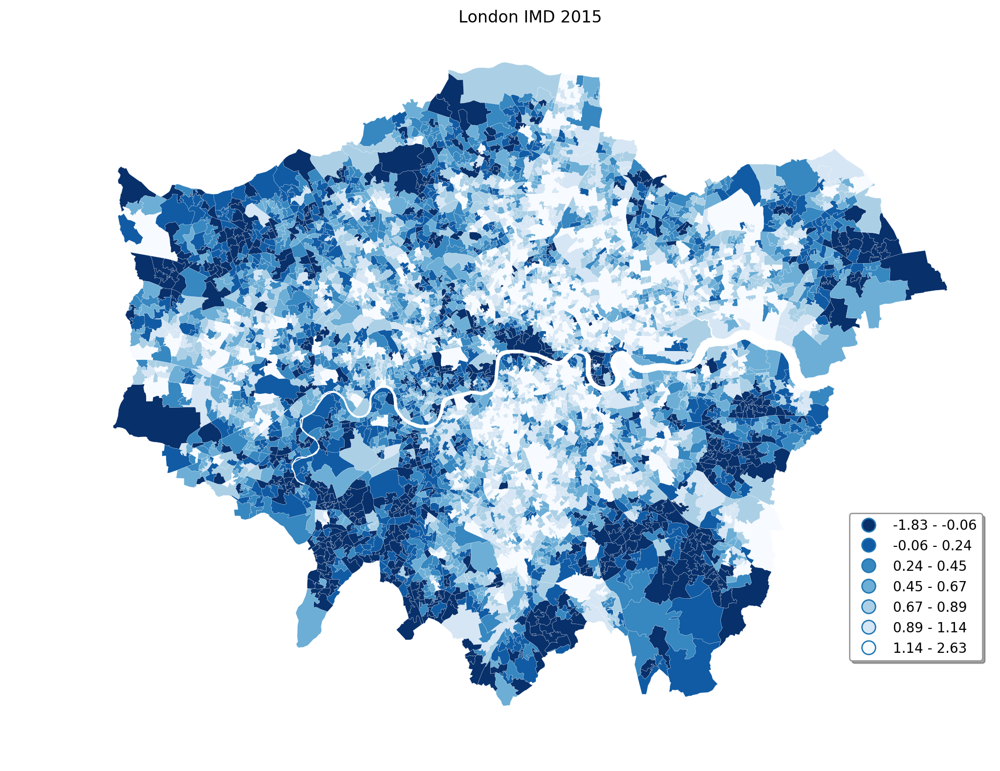

In [39]:
draw_choropleth(imd_london, imd_attribute, 'quantiles', title="London IMD 2015")

## Fisher-Jenks

Equal interval and quantiles are only two examples of very many classification schemes to encode values into colors. Although not all of them are integrated into `geopandas`, `PySAL` includes several other classification schemes (for a detailed list, have a look at this [link](http://pysal.readthedocs.org/en/latest/library/esda/mapclassify.html)). As an example of a more sophisticated one, let us create a Fisher-Jenks choropleth:

In [40]:
classes = ps.Fisher_Jenks(imd_london[imd_attribute], k=7)
classes

               Fisher_Jenks               
 
Lower            Upper               Count
         x[i] <= -0.410                246
-0.410 < x[i] <=  0.037                654
 0.037 < x[i] <=  0.388                961
 0.388 < x[i] <=  0.707               1025
 0.707 < x[i] <=  1.038               1003
 1.038 < x[i] <=  1.444                718
 1.444 < x[i] <=  2.628                228

In [41]:
classes.bins

array([-0.41 ,  0.037,  0.388,  0.707,  1.038,  1.444,  2.628])

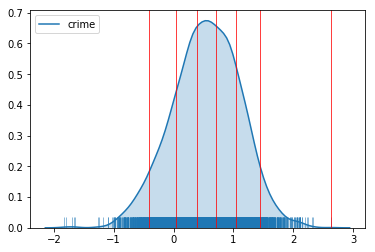

In [42]:
draw_bins(imd_london, imd_attribute, 'fisher_jenks')

Technically, however, the way to create a Fisher-Jenks map is exactly the same as before (it takes time!):

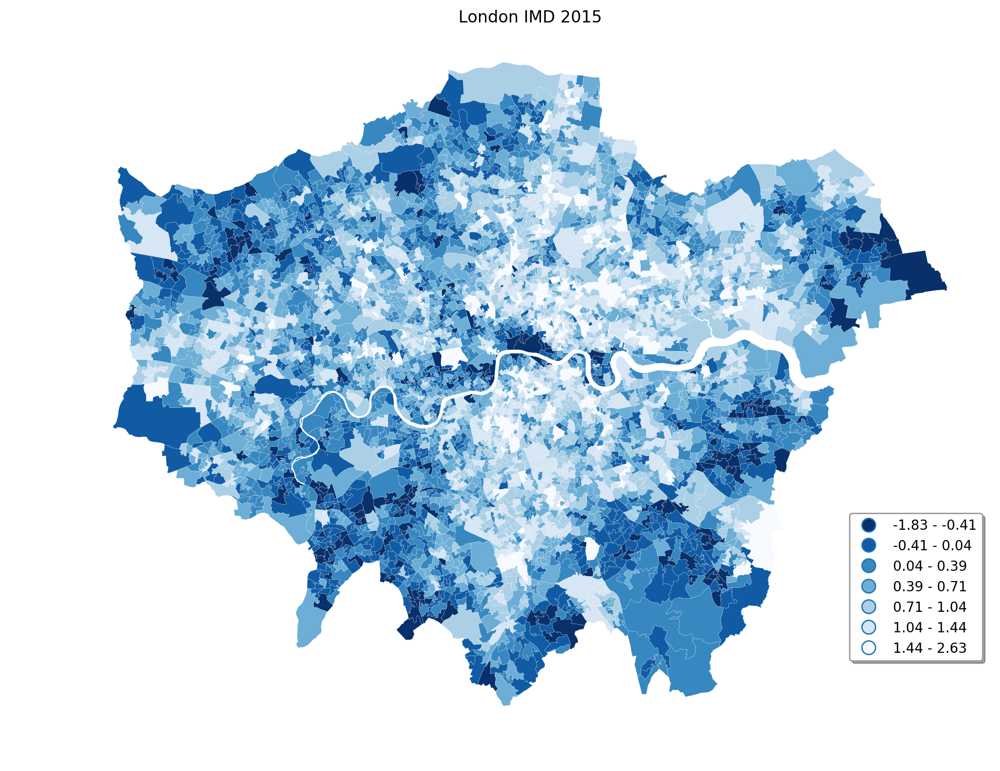

In [43]:
draw_choropleth(imd_london, imd_attribute, 'fisher_jenks', title="London IMD 2015")

In [44]:
def plot_scheme(scheme, var, db, figsize=(16, 6), saveto=None):
    '''
    Plot the distribution over value and geographical space of variable `var` using scheme `scheme
    ...
    
    Arguments
    ---------
    scheme   : str
               Name of the classification scheme to use 
    var      : str
               Variable name 
    db       : GeoDataFrame
               Table with input data
    figsize  : Tuple
               [Optional. Default = (16, 8)] Size of the figure to be created.
    saveto   : None/str
               [Optional. Default = None] Path for file to save the plot.
    '''
    schemes = {'equal_interval': ps.Equal_Interval, \
               'quantiles': ps.Quantiles, \
               'fisher_jenks': ps.Fisher_Jenks}
    classi = schemes[scheme](db[var], k=7)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize, dpi=300)
    # KDE
    sns.kdeplot(db[var], shade=True, color='#26828E', ax=ax1)
    sns.rugplot(db[var], alpha=0.5, color='#26828E', ax=ax1)
    for cut in classi.bins:
        ax1.axvline(cut, color='#31688E', linewidth=0.75)
    ax1.set_title('Value distribution')
    # Map
    p = db.plot(column=var, scheme=scheme, alpha=0.75, k=7, \
             cmap='viridis_r', ax=ax2, linewidth=0.1)
    ax2.axis('equal')
    ax2.set_axis_off()
    ax2.set_title('Geographical distribution')
    f.suptitle(scheme, size=25)
    if saveto:
        plt.savefig(saveto)
    plt.show()

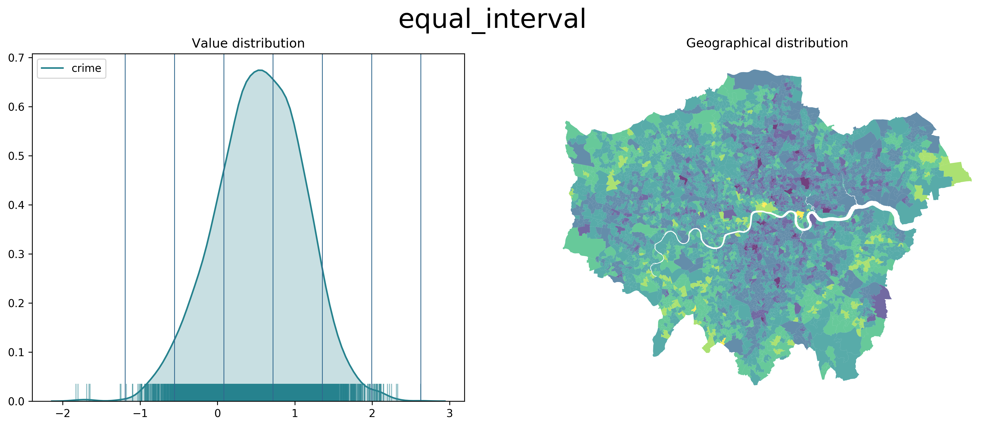

In [45]:
plot_scheme('equal_interval', imd_attribute, imd_london)

## Zooming into the map (trivial)

A general map of an entire region, or urban area, can sometimes obscure particularly local patterns because they happen at a much smaller scale that cannot be perceived in the global view. One way to solve this is by providing a focus of a smaller part of the map in a separate figure. Although there are many ways to do this in Python, the most straightforward one is to reset the limits of the axes to center them in the area of interest.

As an example, let us consider the quantile map produced above:

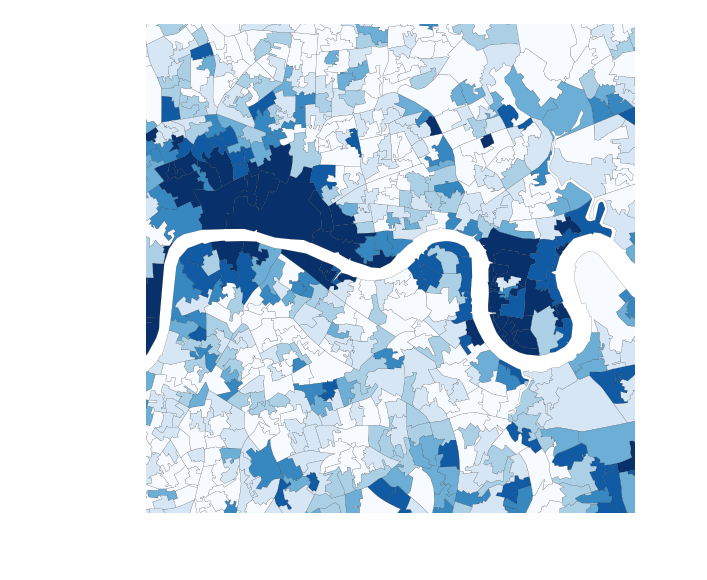

In [46]:
f, ax = plt.subplots(
    1, 
    figsize=(4., 3.),
    dpi=200,
    subplot_kw=dict(aspect='equal'))

ax.axis('off')

imd_london.plot(
    ax=ax,
    column=imd_attribute, 
    scheme='quantiles', k=7, 
    cmap=plt.cm.Blues_r, 
    edgecolor='black',
    lw=0.05,
    alpha=1.0
)

# Redimensionate X and Y axes to desired bounds
ax.set_ylim(175000, 185000)
ax.set_xlim(530000, 540000)
plt.tight_layout()
plt.show()


## Zooming into the map (advanced)

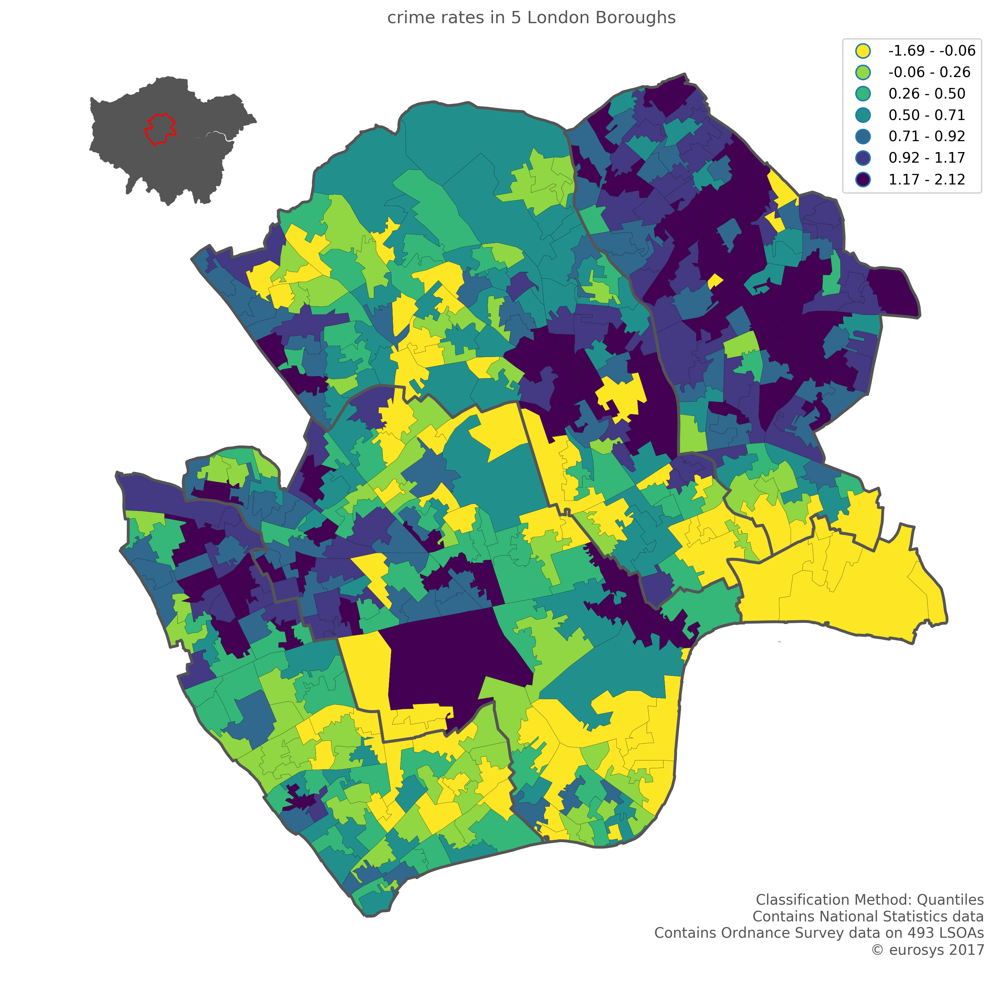

In [47]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

boroughs_selected = ['E09000007', 'E09000033','E09000019','E09000020','E09000001']
# boroughs_selected = imd_london.sort_values(by=imd_attribute, ascending=False).iloc[:10].lad11cd.unique()
scheme = 'Quantiles'

# Load London boroughs
boroughs_df = gpd.read_file("data/shp/London_Borough_Excluding_MHW.shp")
boroughs_df = boroughs_df.loc[boroughs_df['GSS_CODE'].isin(boroughs_selected)]

fig, ax = plt.subplots(
    1,
    figsize=(16., 12.),
    dpi=300,
    subplot_kw=dict(aspect='equal'),
)

imd_london.loc[imd_london['lad11cd'].isin(boroughs_selected)].plot(
#     categorical=True,
    ax=ax,
    alpha=1.,
    column=imd_attribute,
    k=7,
    cmap="viridis_r",
    linewidth=0.1,
    edgecolor='black',
    legend=True, 
    scheme=scheme,
)

# Plot boroughs boundaries
boroughs_df.plot(ax=ax, lw=2, color="none", edgecolor="#555555")

_ = ax.axis('off')

ax.set_title("%s rates in %s London Boroughs" % (imd_attribute, len(boroughs_selected)), color='#555555')

smallprint = ax.text(
    .995, 0,
    'Classification Method: %s\n \
    Contains National Statistics data\n \
    Contains Ordnance Survey data on %d LSOAs\n \
    $\copyright$ eurosys 2017' % (scheme, imd_london['lad11cd'].isin(boroughs_selected).sum()),
    ha='right', va='bottom',
    size=10,
    color='#555555',
    transform=ax.transAxes)

axins = inset_axes(
    ax,
    width="20%", # width = % of parent_bbox
    height=2.0,
    loc=2,
    axes_kwargs={'aspect': 'equal', 'facecolor': '#555555'}
)

inset= imd_london.plot(
    ax=axins,
    color='#555555',
    facecolor='#555555',
    edgecolor='#555555',
    legend=False,
)

union = boroughs_df.unary_union
union_gdf = gpd.GeoDataFrame(geometry=[union])
union_gdf.plot(ax=axins, linewidth=1, edgecolor='red', color='none')

_ = axins.axis('off')
plt.show()


